# UVA_2019_SemesterProject_Learning FIFA players’ traits - What makes an elite soccer player?

## In 2019, the FIFA roster includes a great number of players from a total of 156 countries. The top three participating countries based on the numbers of players are England, Germany and Spain. 

read the data in

In [200]:
import pandas as pd
sample=pd.read_csv('FIFA_1112.csv')
df=sample

## The nationalities of players numerically ordered 

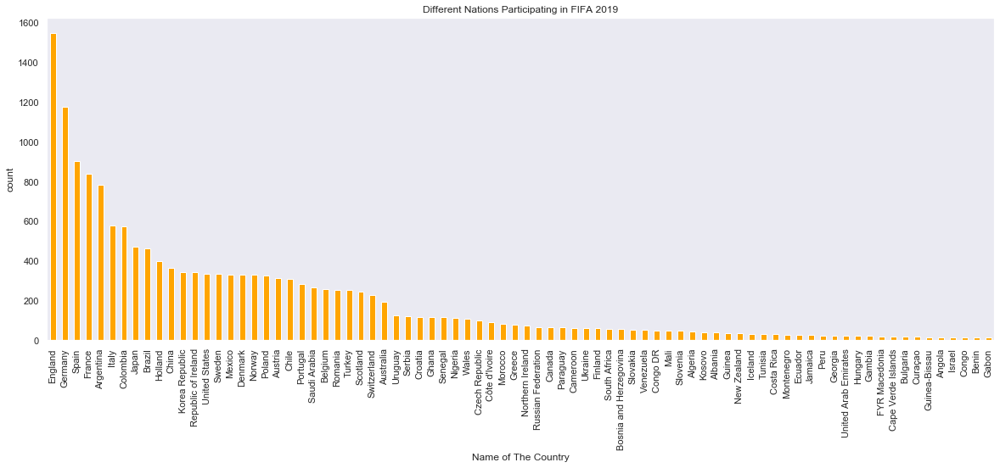

In [201]:
# To show Different nations participating in the FIFA 2019
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
data=df
data['Country'].value_counts().head(80).plot.bar(color = 'orange', figsize = (20, 7))
plt.title('Different Nations Participating in FIFA 2019')
plt.xlabel('Name of The Country')
plt.ylabel('count')
plt.show()

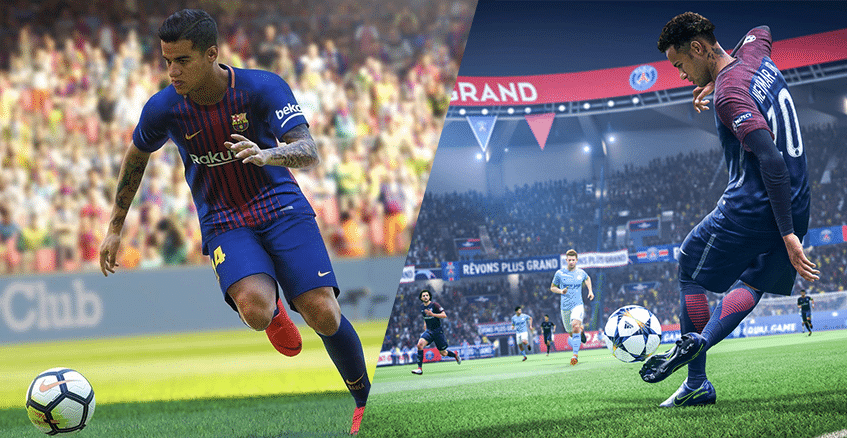

In [202]:
from IPython.display import Image 
Image(filename='1122PHOTO.png')

## Analyze the best player L. Messi

In [203]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

In [204]:
data = pd.read_csv('FIFA1112photo3.csv')

print(data.shape)

(6, 25)


In [205]:
data.sample(5)

,Unnamed: 0,ID,Name,Club,Nationality,Continent,League,Overall,Position,Position Group,...,Passing,Dribbling,Defending,Physicality,Height,Base Stats,In Game Stats,Photo,Flag,Club_Logo
5,5,200389,Jan Oblak,Atlético Madrid,Slovenia,EU,LaLiga Santander,91,GK,Goal Keeper,...,78,89,50,90,188,479,1044,https://cdn.sofifa.org/players/4/19/200389.png,https://cdn.sofifa.org/flags/44.png,https://cdn.sofifa.org/teams/2/light/10.png
2,2,190871,Neymar Jr,Paris Saint-Germain,Brazil,SA,Ligue 1 Conforama,92,LW,Attacker,...,87,95,32,58,175,448,2197,https://cdn.sofifa.org/players/4/19/190871.png,https://cdn.sofifa.org/flags/54.png,https://cdn.sofifa.org/teams/2/light/73.png
0,0,158023,Lionel Messi,FC Barcelona,Argentina,SA,LaLiga Santander,94,RW,Attacker,...,92,96,39,66,170,472,2297,https://cdn.sofifa.org/players/4/19/158023.png,https://cdn.sofifa.org/flags/52.png,https://cdn.sofifa.org/teams/2/light/241.png
4,4,183277,Eden Hazard,Real Madrid,Belgium,EU,LaLiga Santander,91,LW,Attacker,...,86,94,35,66,175,455,2191,https://cdn.sofifa.org/players/4/19/183277.png,https://cdn.sofifa.org/flags/7.png,https://cdn.sofifa.org/teams/2/light/5.png
1,1,20801,Cristiano Ronaldo,Piemonte Calcio,Portugal,EU,Serie A TIM,93,ST,Attacker,...,82,89,35,78,187,467,2265,https://cdn.sofifa.org/players/4/19/20801.png,https://cdn.sofifa.org/flags/38.png,https://cdn.sofifa.org/teams/2/light/45.png


In [206]:
#factor normalization
data['Height'] = data['Height']*0.5
data['Base Stats'] = data['Base Stats']*0.2

In [207]:
players = data[['Name','Defending','Overall','Physicality','Dribbling',
                'Pace','Base Stats','Shooting','Height','Passing','Height',
                'Nationality', 'Photo', 'Club_Logo', 'Club', 'Flag']]

players.head()

,Name,Defending,Overall,Physicality,Dribbling,Pace,Base Stats,Shooting,Height,Passing,Height,Nationality,Photo,Club_Logo,Club,Flag
0,Lionel Messi,39,94,66,96,87,94.4,92,85.0,92,85.0,Argentina,https://cdn.sofifa.org/players/4/19/158023.png,https://cdn.sofifa.org/teams/2/light/241.png,FC Barcelona,https://cdn.sofifa.org/flags/52.png
1,Cristiano Ronaldo,35,93,78,89,90,93.4,93,93.5,82,93.5,Portugal,https://cdn.sofifa.org/players/4/19/20801.png,https://cdn.sofifa.org/teams/2/light/45.png,Piemonte Calcio,https://cdn.sofifa.org/flags/38.png
2,Neymar Jr,32,92,58,95,91,89.6,85,87.5,87,87.5,Brazil,https://cdn.sofifa.org/players/4/19/190871.png,https://cdn.sofifa.org/teams/2/light/73.png,Paris Saint-Germain,https://cdn.sofifa.org/flags/54.png
3,Kevin De Bruyne,61,91,78,87,76,96.0,86,90.5,92,90.5,Belgium,https://cdn.sofifa.org/players/4/19/192985.png,https://cdn.sofifa.org/teams/2/light/10.png,Manchester City,https://cdn.sofifa.org/flags/7.png
4,Eden Hazard,35,91,66,94,91,91.0,83,87.5,86,87.5,Belgium,https://cdn.sofifa.org/players/4/19/183277.png,https://cdn.sofifa.org/teams/2/light/5.png,Real Madrid,https://cdn.sofifa.org/flags/7.png


In [208]:
import requests
import random
from math import pi

import matplotlib.image as mpimg
from matplotlib.offsetbox import (OffsetImage,AnnotationBbox)

def details(row, title, image, Overall, nationality, photo, logo, club):
    
    flag_image = "img_flag.jpg"
    player_image = "img_player.jpg"
    logo_image = "img_club_logo.jpg"
        
    img_flag = requests.get(image).content
    with open(flag_image, 'wb') as handler:
        handler.write(img_flag)
    
    player_img = requests.get(photo).content
    with open(player_image, 'wb') as handler:
        handler.write(player_img)
     
    logo_img = requests.get(logo).content
    with open(logo_image, 'wb') as handler:
        handler.write(logo_img)
        
    r = lambda: random.randint(0,255)
    colorRandom = '#%02X%02X%02X' % (r(),r(),r())
    
    if colorRandom == '#ffffff':colorRandom = '#a5d6a7'
    
    basic_color = '#37474f'
    color_annotate = '#01579b'
    
    img = mpimg.imread(flag_image)
    
    plt.figure(figsize=(15,8))
    categories=list(players)[1:]
    coulumnDontUseGraph = ['Flag', 'Overall', 'Nationality', 'Photo', 'Logo', 'Club']
    N = len(categories) - len(coulumnDontUseGraph)
    
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    ax = plt.subplot(111, projection='polar')
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)
    plt.xticks(angles[:-1], categories, color= 'black', size=17)
    ax.set_rlabel_position(0)
    plt.yticks([25,50,75,100], ["25","50","75","100"], color= basic_color, size= 10)
    plt.ylim(0,100)
    
    values = players.loc[row].drop('Name').values.flatten().tolist() 
    valuesDontUseGraph = [image, Overall, nationality, photo, logo, club]
    values = [e for e in values if e not in (valuesDontUseGraph)]
    values += values[:1]
    
    ax.plot(angles, values, color= basic_color, linewidth=1, linestyle='solid')
    ax.fill(angles, values, color= colorRandom, alpha=0.5)
    axes_coords = [0, 0, 1, 1]
    ax_image = plt.gcf().add_axes(axes_coords,zorder= -1)
    ax_image.imshow(img,alpha=0.5)
    ax_image.axis('off')
    
    ax.annotate('Nationality: ' + nationality.upper(), xy=(10,10), xytext=(103, 138),
                fontsize= 12,
                color = 'white',
                bbox={'facecolor': color_annotate, 'pad': 7})
                      
    ax.annotate('Rating: ' + str(Overall), xy=(10,10), xytext=(43, 180),
                fontsize= 15,
                color = 'white',
                bbox={'facecolor': color_annotate, 'pad': 7})
    
    ax.annotate('Team: ' + club.upper(), xy=(10,10), xytext=(92, 168),
                fontsize= 12,
                color = 'white',
                bbox={'facecolor': color_annotate, 'pad': 7})

    arr_img_player = plt.imread(player_image, format='jpg')

    imagebox_player = OffsetImage(arr_img_player)
    imagebox_player.image.axes = ax
    abPlayer = AnnotationBbox(imagebox_player, (0.5, 0.7),
                        xybox=(313, 223),
                        xycoords='data',
                        boxcoords="offset points"
                        )
    arr_img_logo = plt.imread(logo_image, format='jpg')

    imagebox_logo = OffsetImage(arr_img_logo)
    imagebox_logo.image.axes = ax
    abLogo = AnnotationBbox(imagebox_logo, (0.5, 0.7),
                        xybox=(-320, -226),
                        xycoords='data',
                        boxcoords="offset points"
                        )

    ax.add_artist(abPlayer)
    ax.add_artist(abLogo)

    plt.title(title, size=50, color= basic_color)

In [209]:
# defining a polar graph

def graphPolar(id = 0):
    if 0 <= id < len(data.ID):

        details(row = players.index[id], 
                title = players['Name'][id], 
                Overall = players['Overall'][id], 
                photo = players['Photo'][id],
                nationality = players['Nationality'][id],
                image = players['Flag'][id], 
                logo = players['Club_Logo'][id], 
                club = players['Club'][id])
    else:
        print('The base has 17917 players. You can put positive numbers from 0 to 17917')

## The top FIFA soccer player based on overall performance is the Argentinian Lionel Messi. According to the data provided for the analysis, Messi’s most prominent qualities are: physicality, pace, passing and shooting ability.

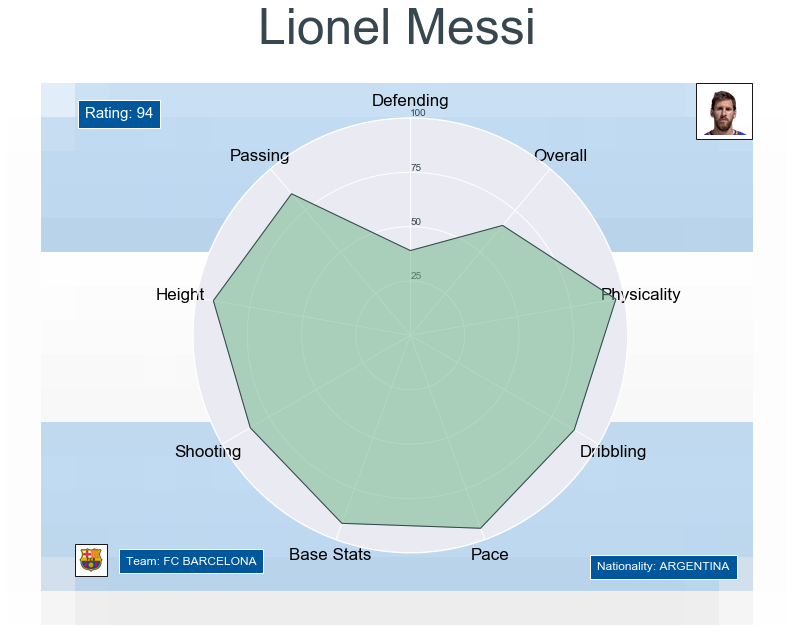

In [210]:
graphPolar(0)

In [211]:
data = pd.read_csv('FIFA_1112.csv')
print(data.shape)

(16359, 21)


## considering the top 10 countries based on overall rating

Text(0, 0.5, 'Overall Rating')

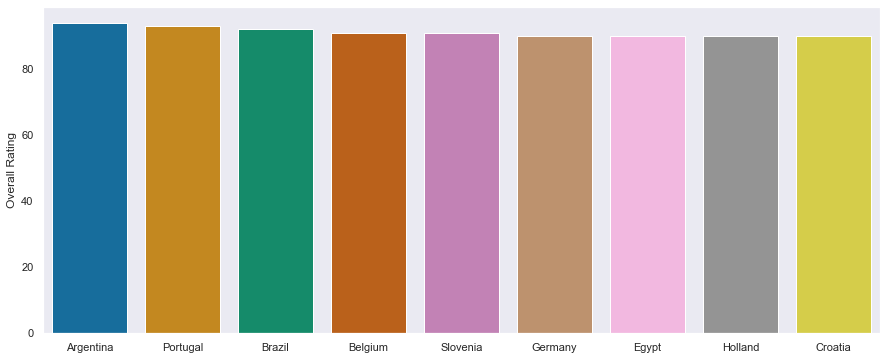

In [212]:
# Generate sequential data and plot 
plt.figure(figsize=(15,6)) 
sd = sample.sort_values('Overall Rating', ascending=False)[:10] 
x1 = np.array(list(sd['Country'])) 
y1 = np.array(list(sd['Overall Rating'])) 
sns.barplot(x1, y1, palette= "colorblind") 
plt.ylabel("Overall Rating")

## The overall top country ranking based on the analysis were shown to be Brazil.

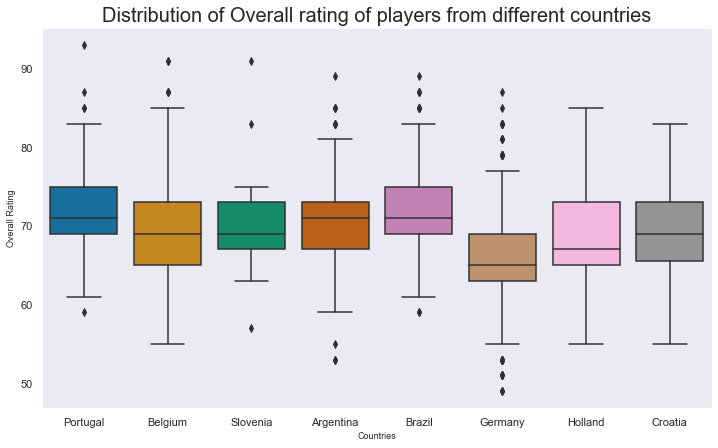

In [213]:
# Top contries overall rating distribution

some_countries = ('Argentina', 'Portugal', 'Brazil', 'Belgium', 'Slovenia', 'Germany', 'Holland', 'Croatia')
df_countries = df.loc[df['Country'].isin(some_countries) & df['Overall Rating']]

plt.rcParams['figure.figsize'] = (12, 7)
ax = sns.boxplot(x = df_countries['Country'], y = df_countries['Overall Rating'], palette = 'colorblind')
ax.set_xlabel(xlabel = 'Countries', fontsize = 9)
ax.set_ylabel(ylabel = 'Overall Rating', fontsize = 9)
ax.set_title(label = 'Distribution of Overall rating of players from different countries', fontsize = 20)
plt.show()

## A corrleation matrix was plotted and displayed as a heatmap to understand correlation between each attribute. The heatmap is color-coded scale of correlation coefficient gives a quick overview of which skills are highly correlated and which are negatively correlated. 

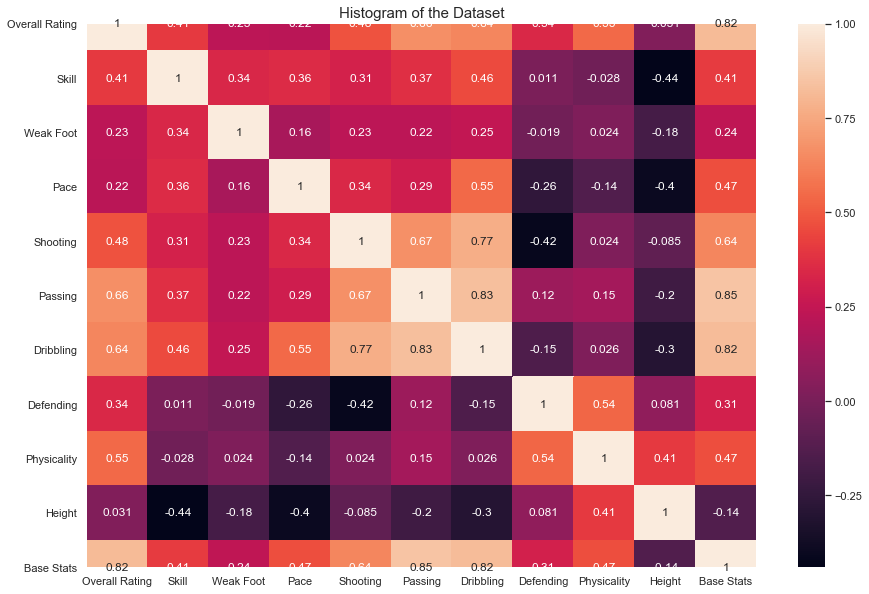

In [214]:
# plotting a correlation heatmap

plt.rcParams['figure.figsize'] = (15, 10)
sns.heatmap(data[['Country', 'Overall Rating', 'Skill', 'Weak Foot', 'Pace',
                    'Shooting', 'Passing', 'Dribbling', 'Defending', 'Physicality',
                    'Height', 'Base Stats', 'In Game Stats']].corr(), annot = True)

plt.title('Histogram of the Dataset', fontsize = 15)
plt.show()

## correlation between each attribute

In [215]:
#Compute pairwise correlation of Dataframe's attributes
corr = data.corr()
corr

,Unnamed: 0,Overall Rating,Skill,Weak Foot,Pace,Shooting,Passing,Dribbling,Defending,Physicality,Height,Base Stats
Unnamed: 0,1.000000,-0.971547,-0.404330,-0.217526,-0.195753,-0.471538,-0.651680,-0.618321,-0.338408,-0.541359,-0.030376,-0.796781
Overall Rating,-0.971547,1.000000,0.405312,0.226443,0.218250,0.478652,0.663701,0.638747,0.341885,0.547524,0.031415,0.816338
Skill,-0.404330,0.405312,1.000000,0.340601,0.356204,0.314743,0.373358,0.459417,0.011243,-0.028350,-0.440749,0.411692
Weak Foot,-0.217526,0.226443,0.340601,1.000000,0.157204,0.225317,0.224419,0.250463,-0.019498,0.023892,-0.179283,0.236855
Pace,-0.195753,0.218250,0.356204,0.157204,1.000000,0.344672,0.294732,0.547633,-0.256435,-0.136198,-0.396187,0.468673
Shooting,-0.471538,0.478652,0.314743,0.225317,0.344672,1.000000,0.669392,0.773640,-0.416687,0.024065,-0.085149,0.635359
Passing,-0.651680,0.663701,0.373358,0.224419,0.294732,0.669392,1.000000,0.834255,0.118976,0.150034,-0.202545,0.851937
Dribbling,-0.618321,0.638747,0.459417,0.250463,0.547633,0.773640,0.834255,1.000000,-0.146342,0.026148,-0.299866,0.820249
Defending,-0.338408,0.341885,0.011243,-0.019498,-0.256435,-0.416687,0.118976,-0.146342,1.000000,0.535492,0.080802,0.310364
Physicality,-0.541359,0.547524,-0.028350,0.023892,-0.136198,0.024065,0.150034,0.026148,0.535492,1.000000,0.406097,0.466993


In [216]:
# Normalized data Height and Base Stats
data['Height'] = data['Height']*0.5
data['Base Stats'] = data['Base Stats']*0.2

## Comparision of field postion with corresponding number of players 

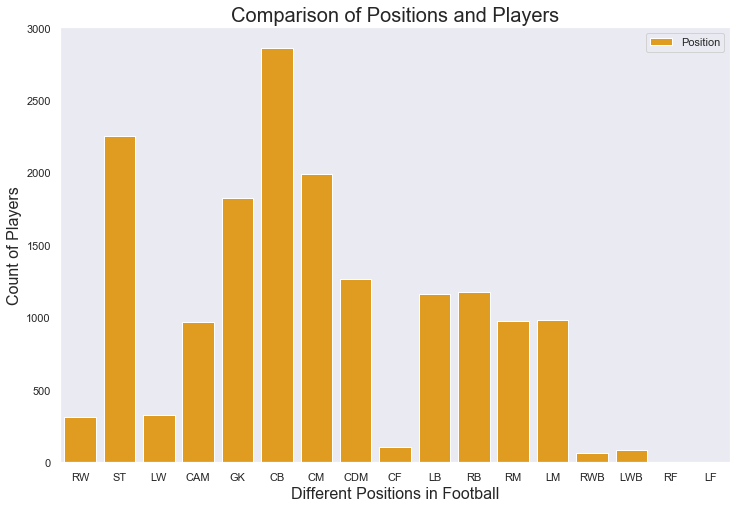

In [217]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize = (12, 8))
sns.set(style = 'dark', palette = 'colorblind', color_codes = True)
ax = sns.countplot('Position', data = data, color = 'orange')
ax.set_xlabel(xlabel = 'Different Positions in Football', fontsize = 16)
ax.set_ylabel(ylabel = 'Count of Players', fontsize = 16)
ax.set_title(label = 'Comparison of Positions and Players', fontsize = 20)
plt.legend(labels=['Position'])
plt.show()

## ## Comparision of field postion group with corresponding number of players 

No handles with labels found to put in legend.


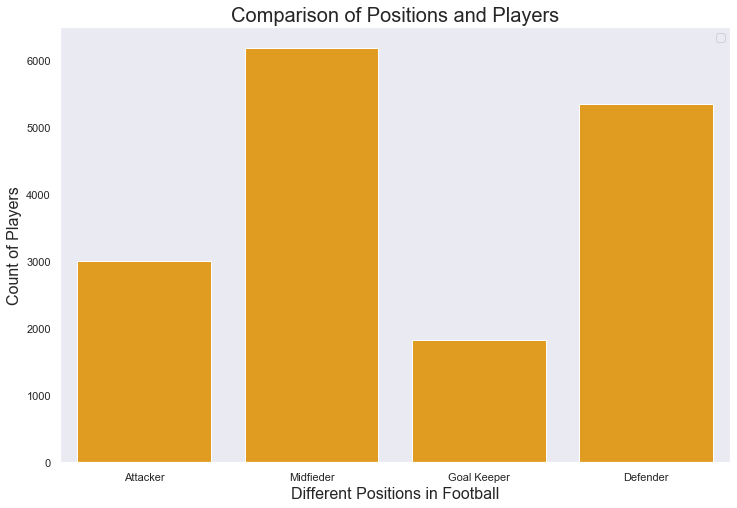

In [218]:
plt.figure(figsize = (12, 8))
sns.set(style = 'dark', palette = 'colorblind', color_codes = True)
ax = sns.countplot('Position Group', data = data, color = 'orange')
ax.set_xlabel(xlabel = 'Different Positions in Football', fontsize = 16)
ax.set_ylabel(ylabel = 'Count of Players', fontsize = 16)
ax.set_title(label = 'Comparison of Positions and Players', fontsize = 20)
ax.legend()
plt.show()

## Height of Players - 180 cm

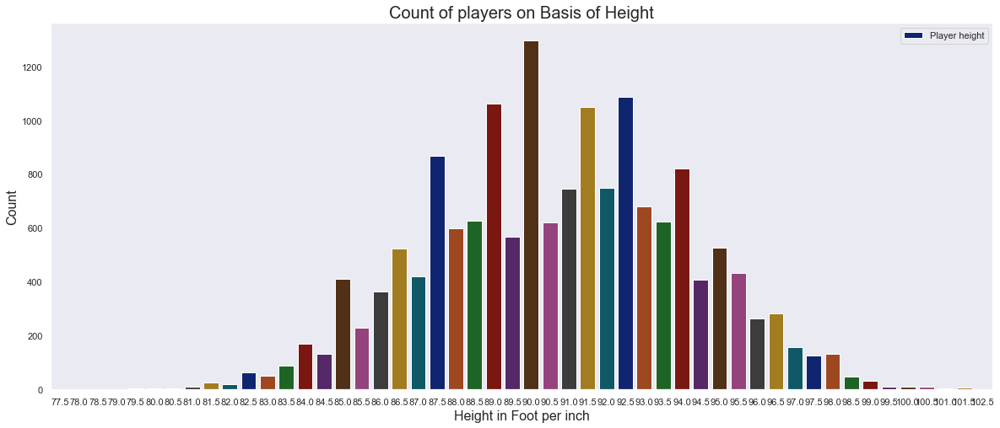

In [219]:
# Height of Players

plt.figure(figsize = (20, 8))
ax = sns.countplot(x = 'Height', data = data, palette = 'dark')
ax.set_title(label = 'Count of players on Basis of Height', fontsize = 20)
ax.set_xlabel(xlabel = 'Height in Foot per inch', fontsize = 16)
ax.set_ylabel(ylabel = 'Count', fontsize = 16)
plt.legend(labels=['Player height'])
plt.show()

## The top 4 required features for player in each position 

In [220]:
# defining the features of players
player_features = ('Weak Foot', 'Pace', 'Shooting', 
                   'Passing', 'Dribbling', 'Defending', 
                   'Physicality', 'Base Stats', 
                   'In Game Stats')

# Top four features for every position in football

for i, val in data.groupby(data['Position'])[player_features].mean().iterrows():
    print('Position {}: {}, {}, {}'.format(i, *tuple(val.nlargest(4).index)))

Position CAM: Base Stats, Pace, Dribbling
Position CB: Physicality, Defending, Base Stats
Position CDM: Base Stats, Physicality, Defending
Position CF: Base Stats, Pace, Dribbling
Position CM: Base Stats, Dribbling, Pace
Position GK: Base Stats, Dribbling, Pace
Position LB: Base Stats, Pace, Physicality
Position LF: Base Stats, Dribbling, Pace
Position LM: Pace, Base Stats, Dribbling
Position LW: Pace, Base Stats, Dribbling
Position LWB: Pace, Base Stats, Physicality
Position RB: Base Stats, Pace, Physicality
Position RF: Pace, Dribbling, Base Stats
Position RM: Pace, Base Stats, Dribbling
Position RW: Pace, Base Stats, Dribbling
Position RWB: Pace, Base Stats, Physicality
Position ST: Base Stats, Pace, Physicality


## The top 4 required features for player in each position group 

In [221]:
# defining the features of players

player_features = ('Pace', 'Shooting', 'Passing', 
                   'Dribbling', 'Defending', 'Physicality', 
)

# Top five features for every position in football

for i, val in df.groupby(df['Position Group'])[player_features].mean().iterrows():
    print('Position {}: {}, {}, {}, {}'.format(i, *tuple(val.nlargest(4).index)))

Position Attacker: Pace, Dribbling, Shooting, Physicality
Position Defender: Physicality, Defending, Pace, Dribbling
Position Goal Keeper: Dribbling, Pace, Physicality, Shooting
Position Midfieder: Pace, Dribbling, Physicality, Passing


## pi plot showing  required features for player in each position 

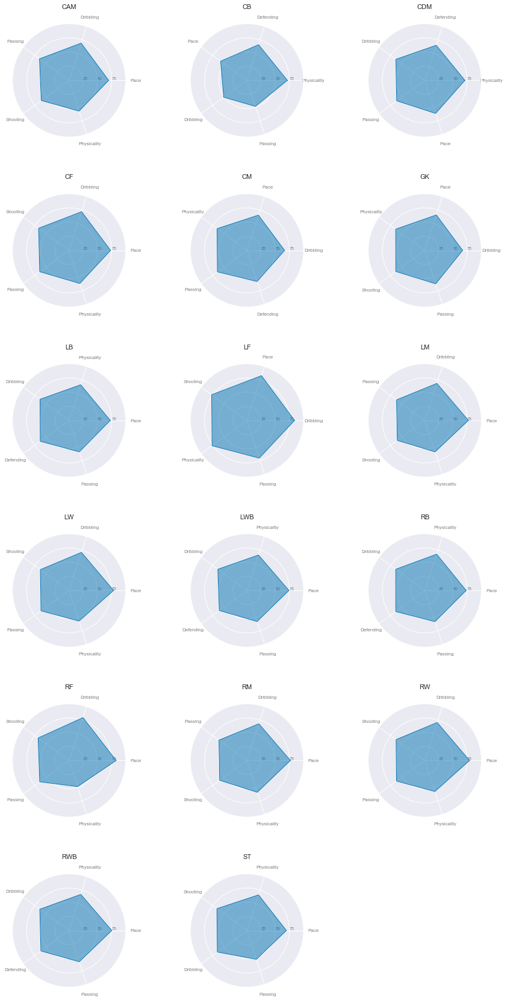

In [222]:
from math import pi

idx = 1
plt.figure(figsize=(15,45))
for position_name, features in data.groupby(data['Position'])[player_features].mean().iterrows():
    top_features = dict(features.nlargest(5))
    
    # number of variable
    categories=top_features.keys()
    N = len(categories)

    # We are going to plot the first line of the data frame.
    # But we need to repeat the first value to close the circular graph:
    values = list(top_features.values())
    values += values[:1]

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(9, 3, idx, polar=True)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=8)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([25,50,75], ["25","50","75"], color="grey", size=7)
    plt.ylim(0,100)
    
    plt.subplots_adjust(hspace = 0.5)
    
    # Plot data
    ax.plot(angles, values, linewidth=1, linestyle='solid')

    # Fill area
    ax.fill(angles, values, 'b', alpha=0.5)
    
    plt.title(position_name, size=11, y=1.1)
    
    idx += 1

## pi plot showing required features for player in each position group

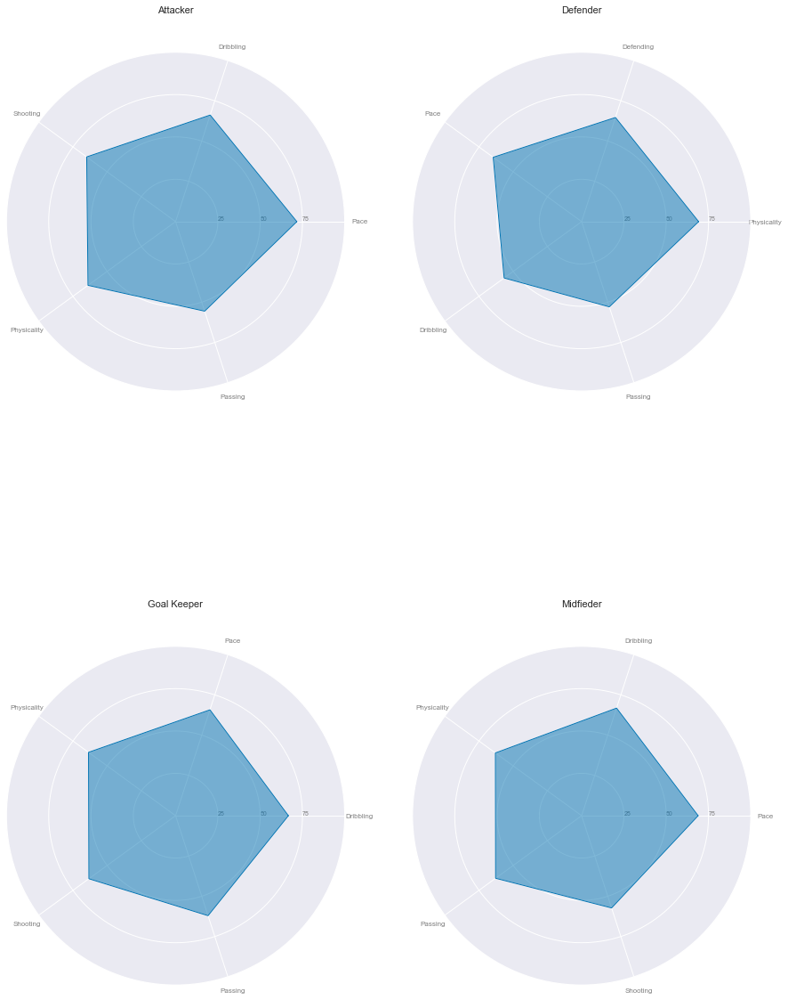

In [223]:
from math import pi

idx = 1
plt.figure(figsize=(15,45))
for position_name, features in data.groupby(data['Position Group'])[player_features].mean().iterrows():
    top_features = dict(features.nlargest(5))
    
    # number of variable
    categories=top_features.keys()
    N = len(categories)

    # We are going to plot the first line of the data frame.
    # But we need to repeat the first value to close the circular graph:
    values = list(top_features.values())
    values += values[:1]

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(4, 2, idx, polar=True)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=8)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([25,50,75], ["25","50","75"], color="grey", size=7)
    plt.ylim(0,100)
    
    plt.subplots_adjust(hspace = 0.5)
    
    # Plot data
    ax.plot(angles, values, linewidth=1, linestyle='solid')

    # Fill area
    ax.fill(angles, values, 'b', alpha=0.5)
    
    plt.title(position_name, size=11, y=1.1)
    
    idx += 1

In [224]:
import os
os.getcwd()

'C:\\Users\\gladies\\1127wonderfulgood'

In [225]:
import holoviews as hv
import panel as pn
import panel.widgets as pnw
import pandas as pd
from bokeh.palettes import Category20

In [226]:
df=pd.read_csv('FIFA_1112.csv')

## Interactive scatter plots are made to allow the selection of attributes of interest to check the correlation, the color and size are also the variables which allow users to select.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
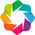

Row
    [0] WidgetBox(css_classes=['widget-box'], width=200)
        [0] Select(name='X-Axis', options=['Base Stats', ...], value='Overall Rating')
        [1] Select(name='Y-Axis', options=['Base Stats', ...], value='Pace')
        [2] Select(name='Color', options=['None', 'Base Stats', ...], value='None')
        [3] Select(name='Size', options=['None', 'Base Stats', ...], value='None')
    [1] ParamFunction(function)

In [227]:
"""
An example demonstrating how to put together a cross-selector app based
on the FIFA dataset.
"""
hv.extension("bokeh","matplotlib")
import holoviews as hv
import panel as pn
import panel.widgets as pnw

from bokeh.sampledata.autompg import autompg

columns = sorted(df.columns)
discrete = [x for x in columns if df[x].dtype == object]
continuous = [x for x in columns if x not in discrete]
quantileable = [x for x in continuous if len(df[x].unique()) > 20]

x = pnw.Select(name='X-Axis', value='Overall Rating', options=quantileable)
y = pnw.Select(name='Y-Axis', value='Pace', options=quantileable)
size = pnw.Select(name='Size', value='None', options=['None'] + quantileable)
color = pnw.Select(name='Color', value='None', options=['None'] + quantileable)

@pn.depends(x.param.value, y.param.value, color.param.value, size.param.value) 
def create_figure(x, y, color, size):
    opts = dict(cmap='rainbow', width=800, height=600, padding=0.1, line_color='black')
    if color != 'None':
        opts['color'] = color 
    if size != 'None':
        opts['size'] = hv.dim(size).norm()*20
    return hv.Points(df, [x, y], label="%s vs %s" % (x.title(), y.title())).opts(**opts)

widgets = pn.WidgetBox(x, y, color, size, width=200)

pn.Row(widgets, create_figure).servable('Cross-selector')

In [228]:
df = pd.read_csv('FIFA_1112.csv', index_col=0,  keep_default_na=False,  na_values='')
df.head()

,Name,Club,Country,Continent,League,Overall Rating,Position,Position Group,Skill,Weak Foot,Work Rate,Pace,Shooting,Passing,Dribbling,Defending,Physicality,Height,Base Stats,In Game Stats
0,Lionel Messi,FC Barcelona,Argentina,SA,LaLiga Santander,94,RW,Attacker,4,4,M / L,87,92,92,96,39,66,170,472,2297
1,Cristiano Ronaldo,Piemonte Calcio,Portugal,EU,Serie A TIM,93,ST,Attacker,5,4,H / L,90,93,82,89,35,78,187,467,2265
2,Neymar Jr,Paris Saint-Germain,Brazil,SA,Ligue 1 Conforama,92,LW,Attacker,5,5,H / M,91,85,87,95,32,58,175,448,2197
3,Kevin De Bruyne,Manchester City,Belgium,EU,Premier League,91,CAM,Midfieder,4,5,H / H,76,86,92,87,61,78,181,480,2311
4,Eden Hazard,Real Madrid,Belgium,EU,LaLiga Santander,91,LW,Attacker,4,4,H / M,91,83,86,94,35,66,175,455,2191


## Display overall rating of players in differnet position groups from their continents

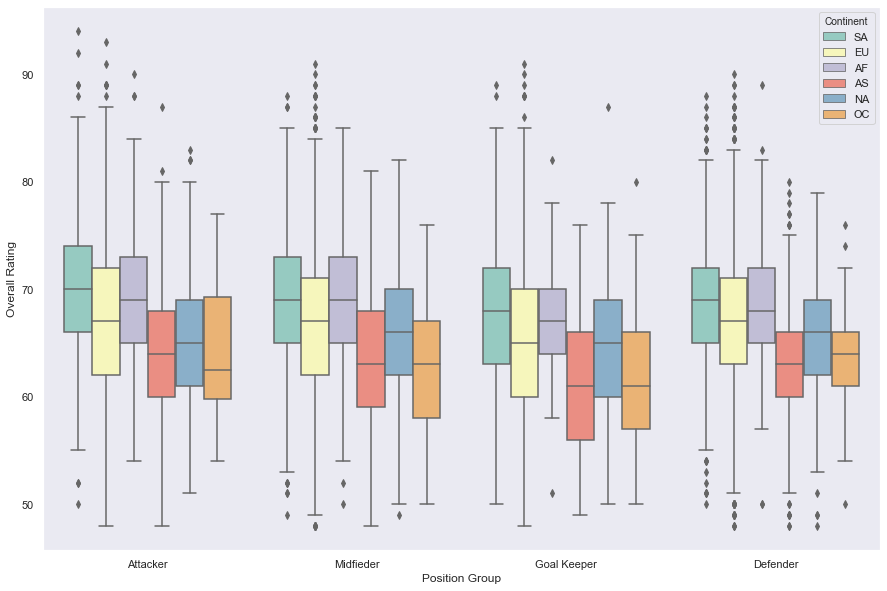

In [229]:
ax = sns.boxplot(x="Position Group", y="Overall Rating", hue="Continent",
...                  data=df, palette="Set3")

## Overall player rating based upon position and home continent 

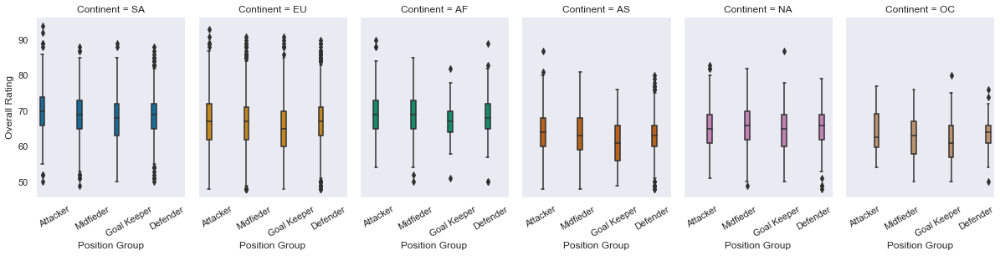

In [230]:
 g = sns.catplot(x="Position Group", y="Overall Rating",
...                 hue="Continent", col="Continent",
...                 data=df, kind="box",
...                 height=4, aspect=.7);
g.set_xticklabels(rotation=30)

## Display of histogram and density plot showing each position group and overall rating 

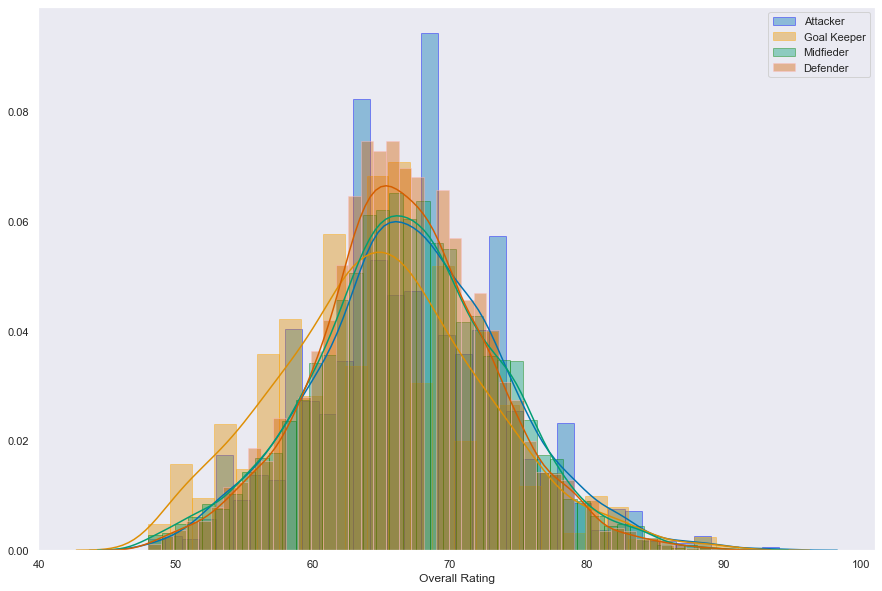

In [231]:
sample=df
f_fuko = sample.loc[sample['Position Group']=='Attacker']['Overall Rating']
m_fuko = sample.loc[sample['Position Group']=='Goal Keeper']['Overall Rating']
f1_fuko = sample.loc[sample['Position Group']=='Midfieder']['Overall Rating']
m1_fuko = sample.loc[sample['Position Group']=='Defender']['Overall Rating']
sns.distplot(f_fuko, hist=True, kde=True, rug=False, hist_kws={'edgecolor':'blue'}, label='Attacker')
sns.distplot(m_fuko, hist=True, kde=True, rug=False, hist_kws={'edgecolor':'orange'}, label='Goal Keeper')
sns.distplot(f1_fuko, hist=True, kde=True, rug=False, hist_kws={'edgecolor':'green'}, label='Midfieder')
sns.distplot(m1_fuko, hist=True, kde=True, rug=False, hist_kws={'edgecolor':'pink'}, label='Defender')
plt.legend()

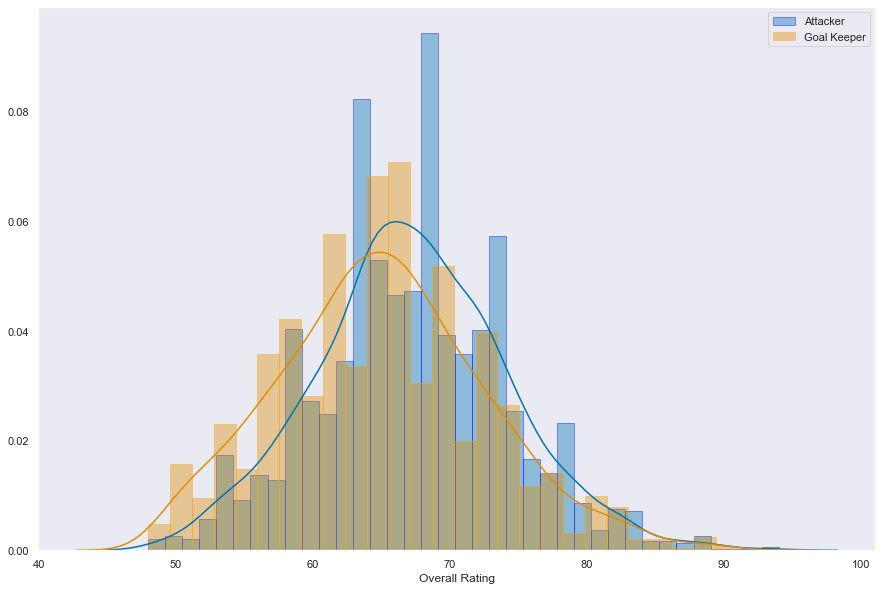

In [232]:
f_fuko = sample.loc[sample['Position Group']=='Attacker']['Overall Rating']
m_fuko = sample.loc[sample['Position Group']=='Goal Keeper']['Overall Rating']
# f1_fuko = sample.loc[sample['Position Group']=='Midfieder']['Overall Rating']
# m1_fuko = sample.loc[sample['Position Group']=='Defender']['Overall Rating']
sns.distplot(f_fuko, hist=True, kde=True, rug=False, hist_kws={'edgecolor':'blue'}, label='Attacker')
sns.distplot(m_fuko, hist=True, kde=True, rug=False, hist_kws={'edgecolor':'orange'}, label='Goal Keeper')
# sns.distplot(f1_fuko, hist=True, kde=True, rug=False, hist_kws={'edgecolor':'green'}, label='Midfieder')
# sns.distplot(m1_fuko, hist=True, kde=True, rug=False, hist_kws={'edgecolor':'pink'}, label='Defender')
plt.legend()

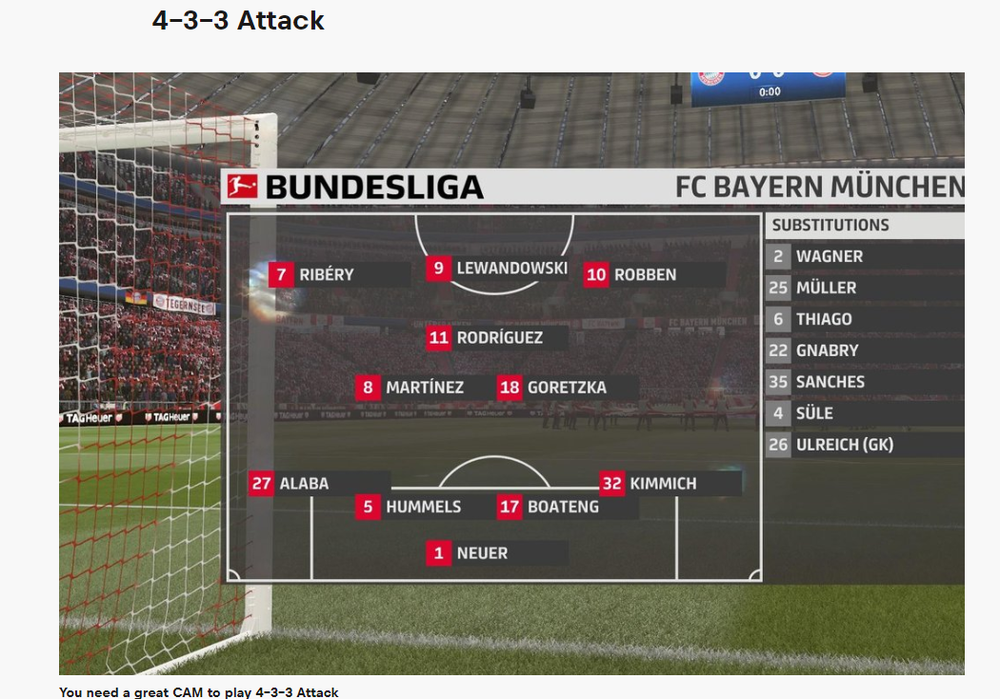

In [233]:
###Gladies Huilin University of Virginia Fall Cohert 
from IPython.display import Image 
Image(filename='FIFAformation.png')

## Best Squard Analysis

In [234]:
data['Potential'] = data['Overall Rating']
data['Value'] = data['Overall Rating']
data['Wage'] = data['Overall Rating']
data['Age'] = data['Overall Rating']
data['Nationality'] = data['Country']
data['Overall'] = data['Overall Rating']
FIFA19 = data[['Name', 'Age', 'Nationality', 'Overall', 'Potential', 'Club', 'Position', 'Value', 'Wage']]
FIFA19.head(10)

,Name,Age,Nationality,Overall,Potential,Club,Position,Value,Wage
0,Lionel Messi,94,Argentina,94,94,FC Barcelona,RW,94,94
1,Cristiano Ronaldo,93,Portugal,93,93,Piemonte Calcio,ST,93,93
2,Neymar Jr,92,Brazil,92,92,Paris Saint-Germain,LW,92,92
3,Kevin De Bruyne,91,Belgium,91,91,Manchester City,CAM,91,91
4,Eden Hazard,91,Belgium,91,91,Real Madrid,LW,91,91
5,Jan Oblak,91,Slovenia,91,91,Atlético Madrid,GK,91,91
6,Marc-André ter Stegen,90,Germany,90,90,FC Barcelona,GK,90,90
7,Mohamed Salah,90,Egypt,90,90,Liverpool,RW,90,90
8,Virgil van Dijk,90,Holland,90,90,Liverpool,CB,90,90
9,Luka Modric,90,Croatia,90,90,Real Madrid,CM,90,90


In [235]:
def get_best_squad_n(formation, nationality, measurement = 'Overall Rating'):
    FIFA19_copy = FIFA19.copy()
    FIFA19_copy = FIFA19_copy[FIFA19_copy['Nationality'] == nationality]
    store = []
    
    for i in formation:
        store.append([
            FIFA19_copy.loc[[FIFA19_copy[FIFA19_copy['Position'].str.contains(i)][measurement].idxmax()]]['Position'].to_string(index = False),
            FIFA19_copy.loc[[FIFA19_copy[FIFA19_copy['Position'].str.contains(i)][measurement].idxmax()]]['Name'].to_string(index = False), 
            FIFA19_copy[FIFA19_copy['Position'].str.contains(i)][measurement].max(),
            FIFA19_copy.loc[[FIFA19_copy[FIFA19_copy['Position'].str.contains(i)][measurement].idxmax()]]['Age'].to_string(index = False),
            FIFA19_copy.loc[[FIFA19_copy[FIFA19_copy['Position'].str.contains(i)][measurement].idxmax()]]['Club'].to_string(index = False),
            FIFA19_copy.loc[[FIFA19_copy[FIFA19_copy['Position'].str.contains(i)][measurement].idxmax()]]['Value'].to_string(index = False),
            FIFA19_copy.loc[[FIFA19_copy[FIFA19_copy['Position'].str.contains(i)][measurement].idxmax()]]['Wage'].to_string(index = False)
        ])
        
        FIFA19_copy.drop(FIFA19_copy[FIFA19_copy['Position'].str.contains(i)][measurement].idxmax(), 
                         inplace = True)
    
    return np.mean([x[2] for x in store]).round(2), pd.DataFrame(np.array(store).reshape(11,7), 
                                                                 columns = ['Position', 'Player', measurement, 'Age', 'Club', 'Value', 'Wage']).to_string(index = False)


In [236]:
def get_summary_n(squad_list, squad_name, nationality_list):
    summary = []

    for i in nationality_list:
        count = 0
        for j in squad_list:
            
            # for overall rating
            O_temp_rating, _  = get_best_squad_n(formation = j, nationality = i, measurement = 'Overall')
            
            summary.append([i, squad_name[count], O_temp_rating.round(2)])    
            count += 1
    
    return summary

## squad formation 

In [237]:
squad_343_strict = ['GK', 'CB', 'CB', 'CB', 'RB|RWB', 'CM|CDM', 'CM|CDM', 'LB|LWB', 'RM|RW', 'ST|CF', 'LM|LW']
squad_442_strict = ['GK', 'RB|RWB', 'CB', 'CB', 'LB|LWB', 'RM', 'CM|CDM', 'CM|CAM', 'LM', 'ST|CF', 'ST|CF']
squad_4312_strict = ['GK', 'RB|RWB', 'CB', 'CB', 'LB|LWB', 'CM|CDM', 'CM|CAM|CDM', 'CM|CAM|CDM', 'CAM|CF', 'ST|CF', 'ST|CF']
squad_433_strict = ['GK', 'RB|RWB', 'CB', 'CB', 'LB|LWB', 'CM|CDM', 'CM|CAM|CDM', 'CM|CAM|CDM', 'RM|RW', 'ST|CF', 'LM|LW']
squad_4231_strict = ['GK', 'RB|RWB', 'CB', 'CB', 'LB|LWB', 'CM|CDM', 'CM|CDM', 'RM|RW', 'CAM', 'LM|LW', 'ST|CF']
squad_list = [squad_343_strict, squad_442_strict, squad_4312_strict, squad_433_strict, squad_4231_strict]
squad_name = ['3-4-3', '4-4-2', '4-3-1-2', '4-3-3', '4-2-3-1']

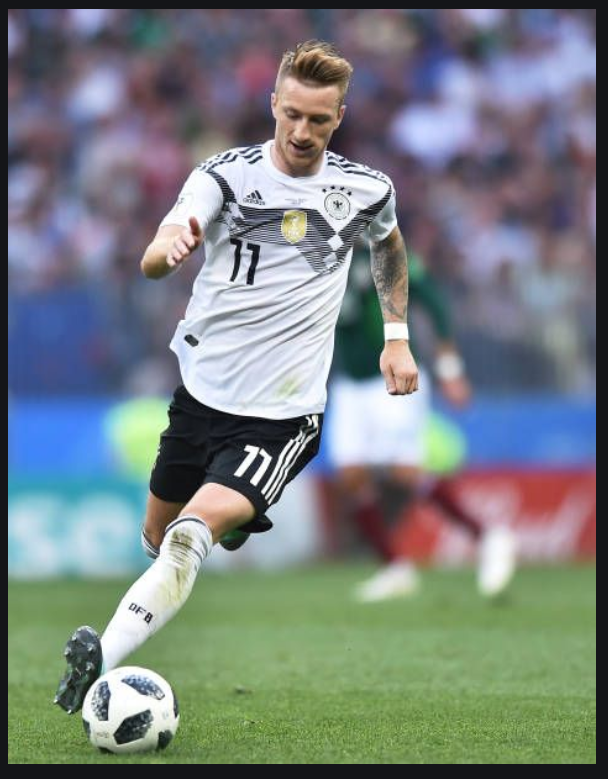

In [238]:
###Gladies Huilin University of Virginia Fall Cohert 
from IPython.display import Image 
Image(filename='FIFAGermany.png')

# Germany

In [239]:
Germany = pd.DataFrame(np.array(get_summary_n(squad_list, squad_name, ['Germany'])).reshape(-1,3), columns = ['Nationality', 'Squad', 'Overall'])
Germany.set_index('Nationality', inplace = True)
Germany['Overall'] = Germany['Overall'].astype(float)
print (Germany)

               Squad  Overall
Nationality                  
Germany        3-4-3    85.36
Germany        4-4-2    84.82
Germany      4-3-1-2    85.64
Germany        4-3-3    85.91
Germany      4-2-3-1    85.73


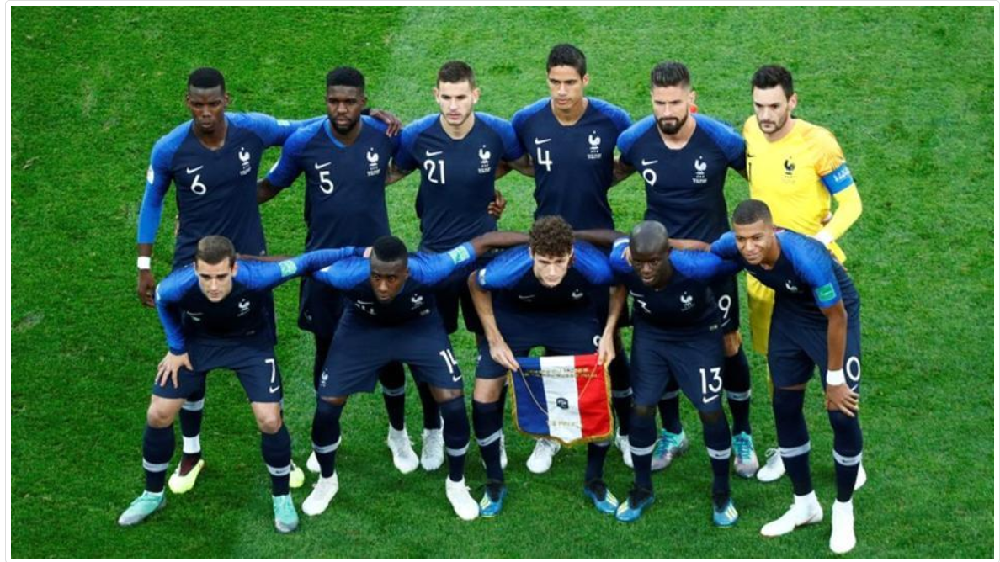

In [240]:
###Gladies Huilin University of Virginia Fall Cohert 
from IPython.display import Image 
Image(filename='FIFAfrance.png')

# France 

In [241]:
France = pd.DataFrame(np.array(get_summary_n(squad_list, squad_name, ['France'])).reshape(-1,3), columns = ['Nationality', 'Squad', 'Overall']) 
France.set_index('Nationality', inplace = True) 
France['Overall'] = France['Overall'].astype(float)  
print (France)

               Squad  Overall
Nationality                  
France         3-4-3    85.64
France         4-4-2    85.36
France       4-3-1-2    86.36
France         4-3-3    85.64
France       4-2-3-1    85.55


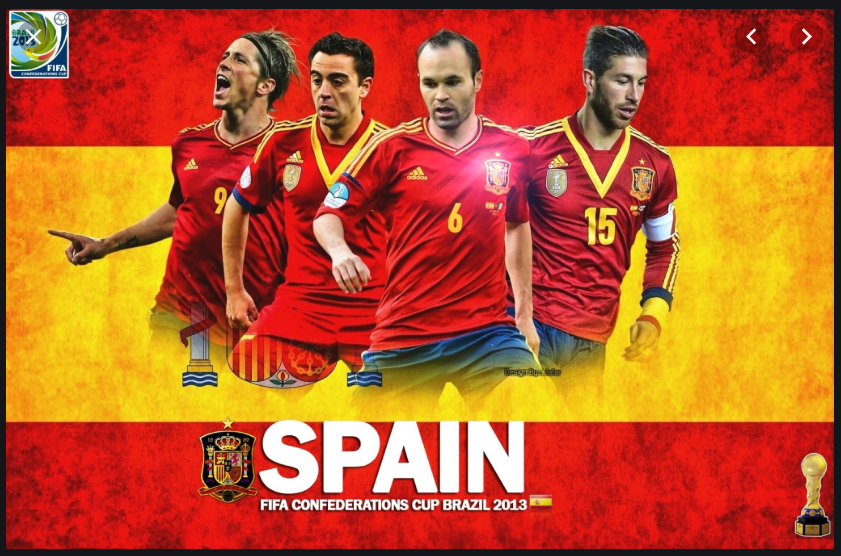

In [242]:
###Gladies Huilin University of Virginia Fall Cohert 
from IPython.display import Image 
Image(filename='FIFASpain.png')

# Spain

In [243]:
Spain = pd.DataFrame(np.array(get_summary_n(squad_list, squad_name, ['Spain'])).reshape(-1,3), columns = ['Nationality', 'Squad', 'Overall'])
Spain.set_index('Nationality', inplace = True)
Spain['Overall'] = Spain['Overall'].astype(float)
print (Spain)

               Squad  Overall
Nationality                  
Spain          3-4-3    86.36
Spain          4-4-2    86.18
Spain        4-3-1-2    86.91
Spain          4-3-3    86.82
Spain        4-2-3-1    86.82


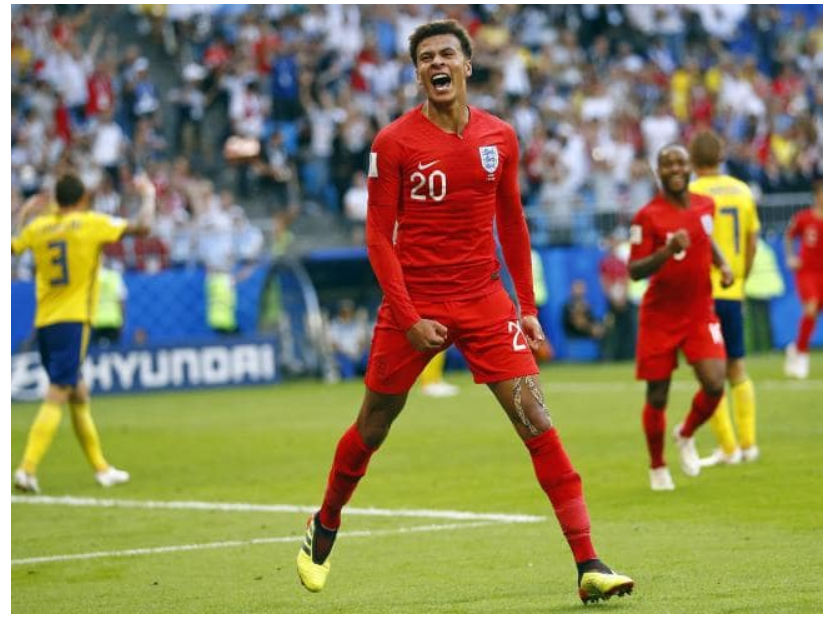

# England

In [245]:
England = pd.DataFrame(np.array(get_summary_n(squad_list, squad_name, ['England'])).reshape(-1,3), columns = ['Nationality', 'Squad', 'Overall'])
England.set_index('Nationality', inplace = True)
England['Overall'] = England['Overall'].astype(float)
print (England)

               Squad  Overall
Nationality                  
England        3-4-3    82.82
England        4-4-2    83.00
England      4-3-1-2    83.00
England        4-3-3    83.27
England      4-2-3-1    83.18


# Brazil

In [246]:
Brazil = pd.DataFrame(np.array(get_summary_n(squad_list, squad_name, ['Brazil'])).reshape(-1,3), columns = ['Nationality', 'Squad', 'Overall'])
Brazil.set_index('Nationality', inplace = True)
Brazil['Overall'] = Brazil['Overall'].astype(float)
print (Brazil)

               Squad  Overall
Nationality                  
Brazil         3-4-3    85.82
Brazil         4-4-2    84.64
Brazil       4-3-1-2    85.09
Brazil         4-3-3    85.91
Brazil       4-2-3-1    85.73


# Argentina

In [247]:
Argentina = pd.DataFrame(np.array(get_summary_n(squad_list, squad_name, ['Argentina'])).reshape(-1,3), columns = ['Nationality', 'Squad', 'Overall'])
Argentina.set_index('Nationality', inplace = True)
Argentina['Overall'] = Argentina['Overall'].astype(float)
print (Argentina)

               Squad  Overall
Nationality                  
Argentina      3-4-3    83.36
Argentina      4-4-2    83.09
Argentina    4-3-1-2    83.45
Argentina      4-3-3    84.27
Argentina    4-2-3-1    84.09


# Belgium 

In [248]:
Belgium = pd.DataFrame(np.array(get_summary_n(squad_list, squad_name, ['Belgium'])).reshape(-1,3), columns = ['Nationality', 'Squad', 'Overall'])
Belgium.set_index('Nationality', inplace = True)
Belgium['Overall'] = Belgium['Overall'].astype(float)
print (Belgium)

               Squad  Overall
Nationality                  
Belgium        3-4-3    84.09
Belgium        4-4-2    84.45
Belgium      4-3-1-2    84.18
Belgium        4-3-3    85.00
Belgium      4-2-3-1    84.82


# Portugal

In [249]:
Portugal = pd.DataFrame(np.array(get_summary_n(squad_list, squad_name, ['Portugal'])).reshape(-1,3), columns = ['Nationality', 'Squad', 'Overall'])
Portugal.set_index('Nationality', inplace = True)
Portugal['Overall'] = Portugal['Overall'].astype(float)
print (Portugal)

               Squad  Overall
Nationality                  
Portugal       3-4-3    84.00
Portugal       4-4-2    83.91
Portugal     4-3-1-2    83.64
Portugal       4-3-3    84.45
Portugal     4-2-3-1    84.45


# A DREAM TEAM! How can we select the best player for each postition to create a dream team based on the maxium overall rating score

## Table displaying best player's name, club and nationality based on position

In [250]:
 # best players per each position with their age, club, and nationality based on their overall scores
data.iloc[data.groupby(data['Position'])['Overall'].idxmax()][['Position', 'Name', 'Club', 'Nationality']]

,Position,Name,Club,Nationality
3,CAM,Kevin De Bruyne,Manchester City,Belgium
8,CB,Virgil van Dijk,Liverpool,Holland
14,CDM,Sergio Busquets,FC Barcelona,Spain
22,CF,Antoine Griezmann,FC Barcelona,France
9,CM,Luka Modric,Real Madrid,Croatia
5,GK,Jan Oblak,Atlético Madrid,Slovenia
43,LB,Jordi Alba,FC Barcelona,Spain
533,LF,Diogo Jota,Wolverhampton Wanderers,Portugal
125,LM,Kingsley Coman,FC Bayern München,France
2,LW,Neymar Jr,Paris Saint-Germain,Brazil


## Table displaying best player's name, club and nationality based on position group

In [251]:
 # best players per each position with their age, club, and nationality based on their overall scores
data.iloc[data.groupby(data['Position Group'])['Overall'].idxmax()][['Position Group', 'Name', 'Club', 'Nationality']]

,Position Group,Name,Club,Nationality
0,Attacker,Lionel Messi,FC Barcelona,Argentina
8,Defender,Virgil van Dijk,Liverpool,Holland
5,Goal Keeper,Jan Oblak,Atlético Madrid,Slovenia
3,Midfieder,Kevin De Bruyne,Manchester City,Belgium


## The overall rating of countries with highest number of players 

In [252]:
# picking up the countries with highest number of players to compare their overall scores

data['Nationality'].value_counts().head(8)

England      1549
Germany      1178
Spain         902
France        838
Argentina     785
Italy         577
Colombia      573
Japan         470
Name: Nationality, dtype: int64

In [253]:
import pandas as pd
sample=pd.read_csv('FIFA_1112.csv')
df1=sample

In [254]:
df=df1.groupby(['Overall Rating', 'Country'], as_index=False).mean()
df.head()

,Overall Rating,Country,Unnamed: 0,Skill,Weak Foot,Pace,Shooting,Passing,Dribbling,Defending,Physicality,Height,Base Stats
0,48,China,16734.111111,2.000000,2.555556,58.888889,34.888889,40.555556,45.777778,39.777778,51.000000,181.444444,270.888889
1,48,Cyprus,16748.000000,2.000000,3.000000,63.000000,41.000000,47.000000,44.000000,42.000000,51.000000,182.000000,288.000000
2,48,Denmark,16730.000000,2.000000,3.000000,67.000000,44.000000,40.000000,52.000000,22.000000,49.000000,170.000000,274.000000
3,48,England,16734.571429,1.857143,2.857143,59.000000,36.000000,42.285714,45.857143,40.714286,50.714286,179.428571,274.571429
4,48,Japan,16726.000000,2.000000,3.000000,56.000000,49.000000,37.000000,47.000000,19.000000,40.000000,170.000000,248.000000


In [255]:
#convert country names which are recongized by python
df['Country'] = pd.np.where(df['Country'] == "Holland", "Netherlands", df['Country'])
df['Country'] = pd.np.where(df['Country'] == "England", "United Kingdom", df['Country'])

In [256]:
#import modules for convert contry name to contry codes
import folium
import pycountry
df['Countryfullname'] = df['Country']
df['Countryfullname_cont'] = df['Country']
countries= df['Country'].unique().tolist()

In [257]:
#convert country to country code to three digits
import pycountry

input_countries = df['Country']

countries = {}
for country in pycountry.countries:
    countries[country.name] = country.alpha_3

codes = [countries.get(country, 'Unknown code') for country in input_countries]

In [258]:
#convert country to country code to two digits then continent
import pycountry
import pycountry_convert as pc
input_countries = df['Countryfullname_cont']

countries = {}
for country in pycountry.countries:
    countries[country.name] = country.alpha_2

codes_cont = [countries.get(country, 'Unknown code') for country in input_countries]

In [259]:
df['Country'] = codes
df.head(5)

,Overall Rating,Country,Unnamed: 0,Skill,Weak Foot,Pace,Shooting,Passing,Dribbling,Defending,Physicality,Height,Base Stats,Countryfullname,Countryfullname_cont
0,48,CHN,16734.111111,2.000000,2.555556,58.888889,34.888889,40.555556,45.777778,39.777778,51.000000,181.444444,270.888889,China,China
1,48,CYP,16748.000000,2.000000,3.000000,63.000000,41.000000,47.000000,44.000000,42.000000,51.000000,182.000000,288.000000,Cyprus,Cyprus
2,48,DNK,16730.000000,2.000000,3.000000,67.000000,44.000000,40.000000,52.000000,22.000000,49.000000,170.000000,274.000000,Denmark,Denmark
3,48,GBR,16734.571429,1.857143,2.857143,59.000000,36.000000,42.285714,45.857143,40.714286,50.714286,179.428571,274.571429,United Kingdom,United Kingdom
4,48,JPN,16726.000000,2.000000,3.000000,56.000000,49.000000,37.000000,47.000000,19.000000,40.000000,170.000000,248.000000,Japan,Japan


In [260]:
import pycountry_convert as pc
df['Countryfullname_cont1'] = codes_cont
df.head(5)

,Overall Rating,Country,Unnamed: 0,Skill,Weak Foot,Pace,Shooting,Passing,Dribbling,Defending,Physicality,Height,Base Stats,Countryfullname,Countryfullname_cont,Countryfullname_cont1
0,48,CHN,16734.111111,2.000000,2.555556,58.888889,34.888889,40.555556,45.777778,39.777778,51.000000,181.444444,270.888889,China,China,CN
1,48,CYP,16748.000000,2.000000,3.000000,63.000000,41.000000,47.000000,44.000000,42.000000,51.000000,182.000000,288.000000,Cyprus,Cyprus,CY
2,48,DNK,16730.000000,2.000000,3.000000,67.000000,44.000000,40.000000,52.000000,22.000000,49.000000,170.000000,274.000000,Denmark,Denmark,DK
3,48,GBR,16734.571429,1.857143,2.857143,59.000000,36.000000,42.285714,45.857143,40.714286,50.714286,179.428571,274.571429,United Kingdom,United Kingdom,GB
4,48,JPN,16726.000000,2.000000,3.000000,56.000000,49.000000,37.000000,47.000000,19.000000,40.000000,170.000000,248.000000,Japan,Japan,JP


In [261]:
df.drop(df.loc[df['Countryfullname_cont1']=='Unknown code'].index, inplace=True)

In [262]:
#Convery contry code to continent
from pycountry_convert import country_alpha2_to_continent_code, country_name_to_country_alpha2
cont1s=df['Countryfullname_cont1'].tolist()
change_cont1s = []
for cont1 in cont1s:
    continent_name = country_alpha2_to_continent_code(cont1)
    change_cont1s.append(continent_name)
df['Countryfullname_cont']=change_cont1s
df.tail(10)

,Overall Rating,Country,Unnamed: 0,Skill,Weak Foot,Pace,Shooting,Passing,Dribbling,Defending,Physicality,Height,Base Stats,Countryfullname,Countryfullname_cont,Countryfullname_cont1
2196,89,URY,13.0,3.0,4.0,73.0,89.0,80.0,84.0,51.0,84.0,182.0,461.0,Uruguay,SA,UY
2197,90,HRV,9.0,4.0,4.0,74.0,76.0,89.0,90.0,72.0,66.0,172.0,467.0,Croatia,EU,HR
2198,90,EGY,7.0,4.0,3.0,93.0,86.0,81.0,89.0,45.0,74.0,175.0,468.0,Egypt,AF,EG
2199,90,DEU,6.0,1.0,4.0,88.0,85.0,88.0,90.0,43.0,88.0,187.0,482.0,Germany,EU,DE
2200,90,NLD,8.0,2.0,3.0,77.0,60.0,70.0,72.0,90.0,86.0,193.0,455.0,Netherlands,EU,NL
2201,91,BEL,3.5,4.0,4.5,83.5,84.5,89.0,90.5,48.0,72.0,178.0,467.5,Belgium,EU,BE
2202,91,SVN,5.0,1.0,3.0,87.0,92.0,78.0,89.0,50.0,90.0,188.0,479.0,Slovenia,EU,SI
2203,92,BRA,2.0,5.0,5.0,91.0,85.0,87.0,95.0,32.0,58.0,175.0,448.0,Brazil,SA,BR
2204,93,PRT,1.0,5.0,4.0,90.0,93.0,82.0,89.0,35.0,78.0,187.0,467.0,Portugal,EU,PT
2205,94,ARG,0.0,4.0,4.0,87.0,92.0,92.0,96.0,39.0,66.0,170.0,472.0,Argentina,SA,AR


In [263]:
country_geo = 'world-countries.json'

In [264]:
stage = df
data_to_plot = stage[['Country','Overall Rating']]

In [265]:
stage = df
data_to_plot = stage[['Country','Overall Rating']]

In [266]:
hist_indicator =  'Overall Rating'

In [267]:
data_to_plot.head()

,Country,Overall Rating
0,CHN,48
1,CYP,48
2,DNK,48
3,GBR,48
4,JPN,48


In [268]:
import os
os.getcwd()

'C:\\Users\\gladies\\1127wonderfulgood'

In [269]:
import json
country_geo = json.load(open("world-countries.json")) 
#country_geo = 'world-countries.json'
map = folium.Map(location=[100, 0], zoom_start=1.5)
#add data layers
#folium.LayerControl().add_to(map)
map.choropleth(geo_data=country_geo, data=data_to_plot,
             columns=['Country', 'Overall Rating'],
             key_on='feature.id',
             fill_color='YlOrRd', fill_opacity=0.5, line_opacity=0.2,
             legend_name=hist_indicator)

C:\Users\gladies\Anaconda3\lib\site-packages\folium\folium.py:415: FutureWarning:

The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.



In [270]:
# Create Folium plot
map.save('plot_data.html')

In [271]:
# Create Folium plot
map.save('plot_data.html')
# Import the Folium interactive html file
from IPython.display import HTML
HTML('<iframe src=plot_data.html width=700 height=450></iframe>')

C:\Users\gladies\Anaconda3\lib\site-packages\IPython\core\display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



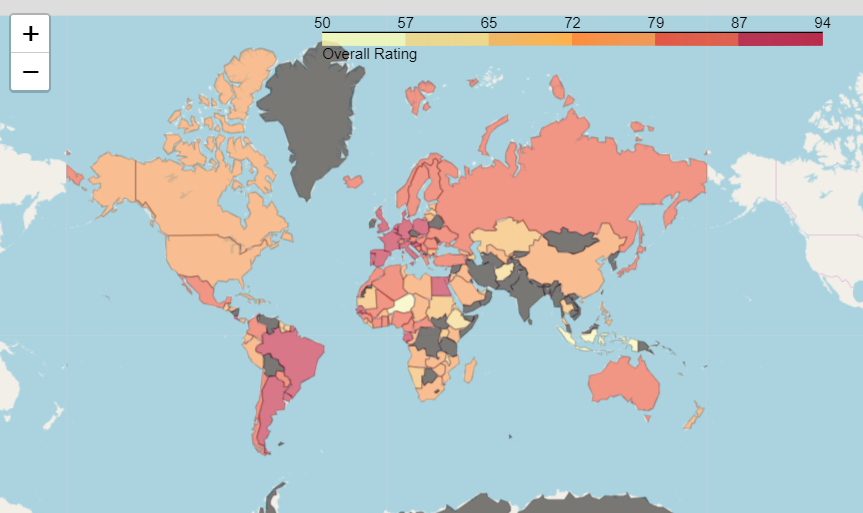

In [274]:
###Gladies Huilin University of Virginia Fall Cohert 
from IPython.display import Image 
Image(filename='fig26.png')

In [272]:
import chart_studio as py
import pandas as pd
import plotly.graph_objs as go


data = [go.Choropleth(
    locations = df['Country'],
    z = df['Overall Rating'],
    text = df['Countryfullname'],
    colorscale = [
        [0.9, "rgb(180, 100, 0)"],
        [0.7, "rgb(180, 100, 20)"],
        [0.5, "rgb(180, 100, 40)"],
        [0.3, "rgb(180, 100, 60)"],
        [0.2, "rgb(180, 100, 80)"],
        [0.1, "rgb(180, 100, 100)"]
    ],
    autocolorscale = True,
    reversescale = True,
    marker = go.choropleth.Marker(
        line = go.choropleth.marker.Line(
            color = 'rgb(180,180,180)',
            width = 0.5
        )),
        colorbar = go.choropleth.ColorBar(
        tickprefix = ' ',
         title = 'color by country'),
)]

layout = go.Layout(
    title = go.layout.Title(
        text = '2019 FIFA'
    ),
    geo = go.layout.Geo(
        showframe = False,
        showcoastlines = True,
        projection = go.layout.geo.Projection(
        type = 'equirectangular'
        )
    ),
    annotations = [go.layout.Annotation(
        x = 0.55,
        y = 0.1,
        xref = 'paper',
        yref = 'paper',
        text = 'Source: 2019 FIFA',
        showarrow = False
    )]
)

fig = go.Figure(data = data, layout = layout)
fig.show()